# Titanic Survival Prediction using Machine Learning
##### Faisal Irzal

## Table of contents
1. [Introduction](#introduction)
2. [Objective](#objective)
3. [Data](#data)
4. [Methodology](#methodology)
5. [Data Visualization & Pre-Processing](#dv-preproc)
6. [Feature Analysis](#fa)
7. [Predictive Analysis](#pa)
8. [Conclusion](#co)

## 1. Introduction  <a name="introduction"></a>
This Notebook is meant to answer the Titanic Machine Learning (ML) competition on Kaggle platform.

The sinking of the Titanic is one of the most infamous shipwrecks in history.

On April 15, 1912, during her maiden voyage, the widely considered “unsinkable” RMS Titanic sank after colliding with an iceberg. Unfortunately, there weren’t enough lifeboats for everyone onboard, resulting in the death of 1502 out of 2224 passengers and crew.

While there was some element of luck involved in surviving, it seems some groups of people were more likely to survive than others.

## 2. Objective  <a name="objective"></a>
The objective of this analysis is to build a predictive model that can answer the question: “what sorts of people were more likely to survive?” using the given passenger data (i.e. name, age, gender, socio-economic class, etc).

## 3. Data  <a name="data"></a>
The data has been split into two groups:
* training set (train.csv)
* test set (test.csv)

The training set should be used to build the machine learning models. For the training set, the outcome for each passenger is provided, also known as the “ground truth”. The developed model will be based on “features” or variables like passengers’ gender and class. Furthermore, feature engineering can also be used to create new features.

The test set should be used to see how well the developed model performs on unseen data. For the test set, the ground truth for each passenger will not be provided. It is participant's job to predict these outcomes. For each passenger in the test set, the trained model will be used to predict whether or not they survived the sinking of the Titanic.

The data includes the following variables/features:

| Variable | Definition  | Key                     |
| :------- | :----:      | ----------------------:|
| Survived | Survival	 |0 = No, 1 = Yes          |
|Pclass	   |Ticket class |1 = 1st, 2 = 2nd, 3 = 3rd|
|Sex	   |Gender category	         |
|Age	   |Age in years |	                       |
|SibSp	   |# of siblings / spouses aboard the Titanic| |	
|Parch	   |# of parents / children aboard the Titanic| |	
|Ticket	   |Ticket number | |	
|Fare	   |Passenger fare|	|
|Cabin	   |Cabin number  | | 	
|Embarked  |Port of Embarkation	|C = Cherbourg, Q = Queenstown, S = Southampton  |

Some notes are as per below:

**Pclass**: A proxy for socio-economic status (SES)
* 1st = Upper
* 2nd = Middle
* 3rd = Lower

**Age**: Age is fractional if less than 1. If the age is estimated, it is rounded to nearest integer.

**SibSp**: The dataset defines family relations in this way...
* Sibling = brother, sister, stepbrother, stepsister
* Spouse = husband, wife (mistresses and fiancés were ignored)

**Parch**: The dataset defines family relations in this way...
* Parent = mother, father
* Child = daughter, son, stepdaughter, stepson

Some children travelled only with a nanny, therefore parch=0 for them.

## 4. Methodology  <a name="methodology"></a>
The following teps will be used n building the predictive model:
* Data visualization & pre-processing 
    In this section all the dataset will be described using descriptive statistical methods, fill in the missing values with some kind of imputation, and visualize the data. 
* Feature analysis
    All features and their correlations with each other will be described in this section. Also the required datasets will be made ready for predictive analysis.
* Predictive analysis using some ML techniques
    In this section, selected Machine Learning techniques will be briefly explained, model classifiers will be built based on the given Training set, the developed models will be tested against the given Test set and accuracy of each developed model will be analysed and compared. The best classifier wil be chosen based on the its resulting accuracy analysis.

## 5 Data Visualization & Pre-Processing <a name="dv-preproc"></a>
First, let's import all required libraries used for the analysis and visualization.

In [1]:
import pandas as pd
import numpy as np
import sys
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score

from sklearn import preprocessing

Furthermore, let's load the given Train and Test data into separate dataframe.

In [2]:
train_data = pd.read_csv('../data/train.csv')
test_data  = pd.read_csv('../data/test.csv')

Display the first 5 rowns of the train and test data in a Table we get the following

In [3]:
train_data.head(5)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
test_data.head(5)

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [5]:
train_data.drop(['PassengerId'],axis=1,inplace=True)
test_data.drop(['PassengerId'],axis=1,inplace=True)

Check the missing values

In [6]:
train_data.isnull().sum()

Survived      0
Pclass        0
Name          0
Sex           0
Age         177
SibSp         0
Parch         0
Ticket        0
Fare          0
Cabin       687
Embarked      2
dtype: int64

In [7]:
test_data.isnull().sum()

Pclass        0
Name          0
Sex           0
Age          86
SibSp         0
Parch         0
Ticket        0
Fare          1
Cabin       327
Embarked      0
dtype: int64

Before analyzing each feature, let's generate correlation matrix to the pairwise correlation between features including the correlation of the survival rate vs. passenger features. Please be informed that at this moment we drop the feature 'Cabin' and 'Name' from the overview. We will pick up the analysis later.

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:4563: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


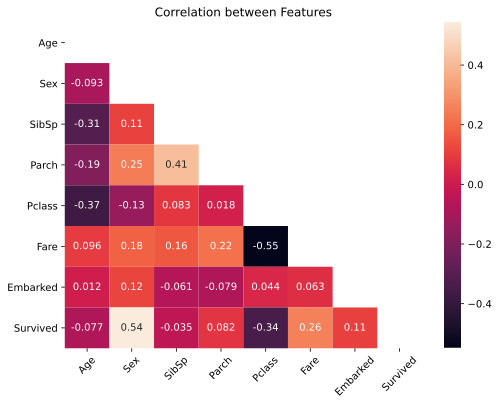

In [8]:
# Prepare Data
train_data_new = train_data[["Age","Sex","SibSp","Parch","Pclass","Fare","Embarked", "Survived"]]
train_data_new['Sex'].replace(['male','female'],[0,1],inplace=True)
train_data_new['Embarked'].replace(['S','C','Q'],[0,1,2],inplace=True)

# Create Matrix
matrix = np.triu(train_data_new.corr())
plt.figure(figsize=(8,6))
plt.xticks(rotation=45)
plt.title('Correlation between Features')
sns.heatmap(train_data_new.corr(), annot=True, mask=matrix)
plt.show()

From the matrix below we observe the following correlations:
* Survived vs. Sex; female passenger tends to have high survival rate than male passenger
* Survived vs. Pclass; passenger from Class #1 tends to have high survival rate than passenger from other classes
* Fare vs. Pclass; higher class ticket appears to be more expensive
* Pclass vs. Age; old passengers tend to choose higher class ticket
* Parch vs. SibSp; obviously, passenger who indicates to have parent/children on board would definitely indicate the number of siblings/spouses as well 
* SibSp vs. Age; passenger with siblings/spouses on board tend to be in younger age; can be children or young family with children. Old couple with children will be rare to find on board.

## 6. Feature Analysis <a name="fa"></a>

#### 6.1 Age

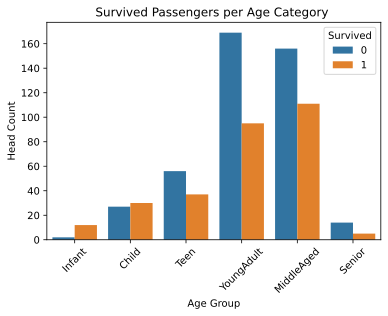

Survival rate per age category
 Age_Cat
Infant        85.7
Child         52.6
Teen          39.8
YoungAdult    36.0
MiddleAged    41.6
Senior        26.3
Name: Survived, dtype: float64


In [9]:
train_date_age = train_data
age_bins = [0,1,13,19,31,61,sys.maxsize]
age_cat_train = pd.cut(train_data['Age'],age_bins,labels=['Infant','Child','Teen','YoungAdult','MiddleAged','Senior'])
train_date_age['Age_Cat'] = age_cat_train

axes = sns.countplot(x="Age_Cat", hue="Survived", data=train_data)
axes.set_title('Survived Passengers per Age Category ')
axes.set_xlabel('Age Group')
axes.set_ylabel('Head Count')
plt.xticks(rotation=45)
plt.show()

print('Survival rate per age category\n',train_data.groupby(["Age_Cat"])["Survived"].mean().round(3)*100)

From figure above we observe that majority of the survived passengers came from middle aged group category. Unfortunately more than half of that category didn't survive the tragedy. On the other hand, infant passengers had the best chance to survive with a rate of 85.7% compare to other age group passengers. This may due to the fact that their parents played an important role. We will observe this later during analysis of feature 'SibSp' and 'Parch'.

#### 6.2 Sex

<AxesSubplot:xlabel='Sex', ylabel='count'>

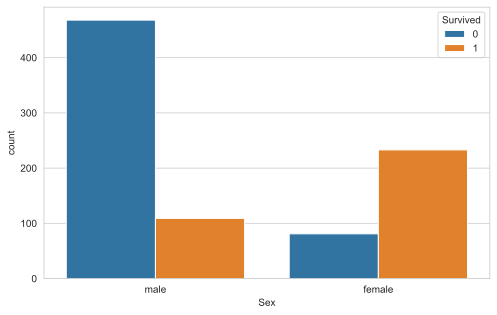

In [10]:
plt.figure(figsize=(8, 5))
sns.set_style('whitegrid')
sns.countplot(x = 'Sex',hue='Survived',data=train_data)

Convert categorical feature male & female into numerical using get_dummies()

In [11]:
sex1 = pd.get_dummies(train_data['Sex'])
sex2 = pd.get_dummies(test_data['Sex'])

train_data.drop(['Sex'],axis=1,inplace=True)
test_data.drop(['Sex'],axis=1,inplace=True)

train = pd.concat([train_data,sex1],axis=1)
test = pd.concat([test_data,sex2],axis=1)

In [12]:
train.head()

,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Age_Cat,female,male
0,0,3,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,NaN,S,YoungAdult,0,1
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,C85,C,MiddleAged,1,0
2,1,3,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,YoungAdult,1,0
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,C123,S,MiddleAged,1,0
4,0,3,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,NaN,S,MiddleAged,0,1


Drop one column since the other has already contained the information

In [13]:
train.drop(['female'],axis=1,inplace=True) 
test.drop(['female'],axis=1,inplace=True) 

Rename column 'male' with 'gender'. Note that gender '1' represents 'male' and '0' represents 'female'

In [14]:
train.rename(columns={'male':'gender'}, inplace = True)
test.rename( columns={'male':'gender'}, inplace = True)

#### 6.3 Pclass

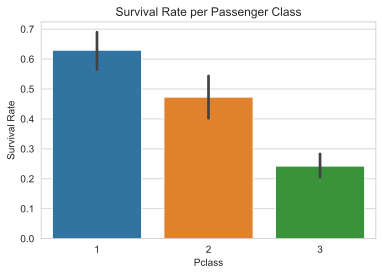

Pclass
1    63.0
2    47.3
3    24.2
Name: Survived, dtype: float64


In [15]:
axes = sns.barplot(x="Pclass", y="Survived", data=train_data)
axes.set_title('Survival Rate per Passenger Class')
axes.set_xlabel('Pclass')
axes.set_ylabel('Survival Rate')
plt.show()

print(train_data.groupby(["Pclass"])["Survived"].mean().round(3)*100)

Here we can see that people from higher class had a better chance of survival, followed by Class 2 and Class 3. Furthermore, let's check the correlation of Pclass with respect to Age.

Average age of passengers per
 Pclass
1    38.0
2    30.0
3    25.0
Name: Age, dtype: float64


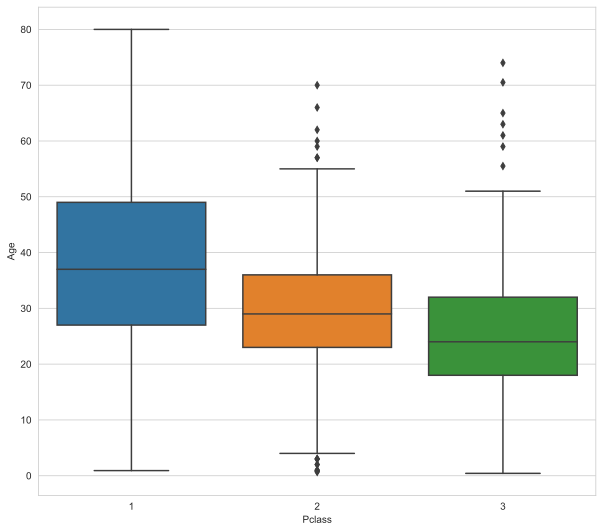

In [16]:
plt.figure(figsize=(10, 9))
sns.boxplot(x='Pclass',y='Age',data=train_data)
print('Average age of passengers per\n', train_data.groupby(["Pclass"])["Age"].mean().round(0))

The above boxplot tells us the passengers age distribution per each Pclass. It is indeed noted that old passengers tend to choose higher class. Age distribution per each Class can be seen in the density plot below.

Text(0, 0.5, 'Density')

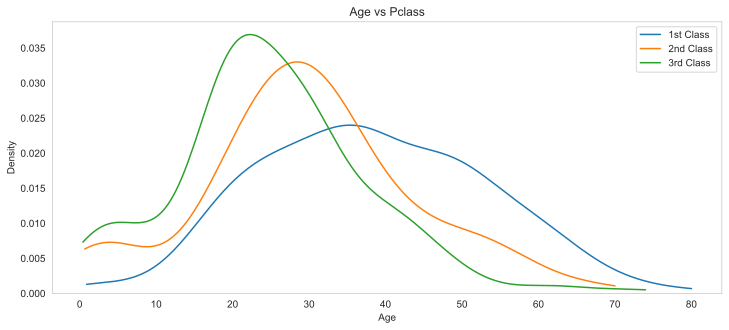

In [17]:
plt.figure(figsize=(12, 5))
for x in [1,2,3]:    ## for 3 classes
    sns.kdeplot(data=train_data.Age[train_data.Pclass == x],cut = 0, clip=(0,200)).grid(False)
    
plt.title("Age vs Pclass")
plt.legend(("1st Class","2nd Class","3rd Class"))
plt.xlabel("Age")
plt.ylabel("Density")

This graph shows that passengers of Class 3 have younger age compare to Class 1

Next, the missing values of feature 'Age' will be replaced by its median value of each class

In [18]:
pclass_age_map = {
  1: 38,
  2: 30,
  3: 25,
} #median age as calculated above

def replace_age_na(x_df, fill_map):
    cond=x_df['Age'].isna()
    res =x_df.loc[cond,'Pclass'].map(fill_map)
    x_df.loc[cond,'Age']=res
    return x_df

In [19]:
train = (train.pipe(replace_age_na, pclass_age_map))
test  = (test.pipe(replace_age_na, pclass_age_map))

#### 6.4 Fare

Passengers fare distribution is analyzed based on survival case as per below.

In [20]:
Fare_0 = []
Fare_1 = []
for i in range(0,891):
    if train_data["Survived"][i] == 0:
        Fare_0.append(train["Fare"][i])
    else:
        Fare_1.append(train["Fare"][i])

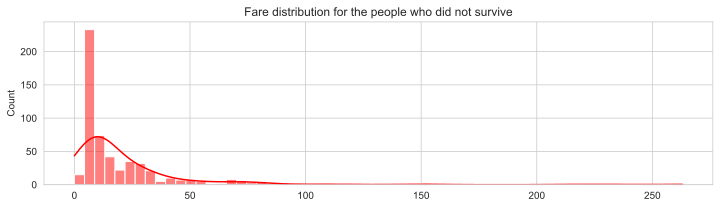

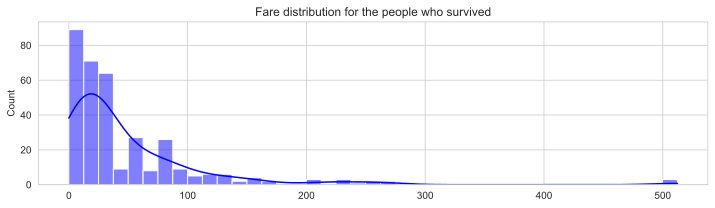

In [21]:
f, axes = plt.subplots(1,1, figsize = (12, 3))
g1 = sns.histplot(Fare_0, color="red",ax = axes, kde=True)
plt.title("Fare distribution for the people who did not survive")

f, axes = plt.subplots(1,1, figsize = (12, 3))
g1 = sns.histplot(Fare_1, color="blue",ax = axes, kde=True)
plt.title("Fare distribution for the people who survived")

plt.show()

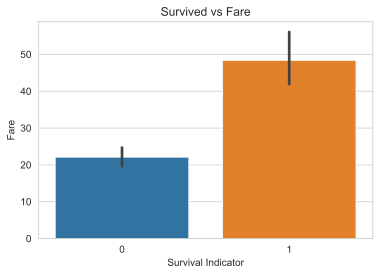

Survived
0    22.12
1    48.40
Name: Fare, dtype: float64


In [22]:
axes = sns.barplot(x="Survived", y="Fare", data=train_data)
axes.set_title('Survived vs Fare')
axes.set_xlabel('Survival Indicator')
axes.set_ylabel('Fare')
plt.show()

print(train_data.groupby(["Survived"])["Fare"].mean().round(2))

From the above figures it is clearly shown that passengers who paid more had greater probability to survive. The barplot showed that those who survived had paid on average slightly more than twice as much as those who didnt survive the tragedy.

Now let's replace the missing value of Fare column in Test set with the median value of the 'Fare'.

In [23]:
test["Fare"].fillna(test['Fare'].describe().loc[['50%']][0], inplace = True) 

#### 6.5 Embarked

<AxesSubplot:xlabel='Embarked', ylabel='count'>

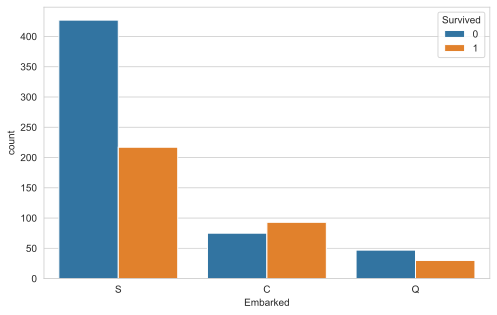

In [24]:
plt.figure(figsize=(8, 5))
sns.set_style('whitegrid')
sns.countplot(x = 'Embarked',hue='Survived',data=train_data)

More survivals embarked from Southampton, continued by survival from Cherbourg and from Queenstown.
From above we can also conclude that mode value (most occuring value) of the feature 'Embarked' is Southampton. Let's use this to replace Null values for that feature.

In [25]:
train["Embarked"].fillna("S", inplace = True) 
test["Embarked"].fillna("S", inplace = True) 

Convert categorical feature C, Q & S into numerical using get_dummies()

In [26]:
embark1 = pd.get_dummies(train['Embarked'])
embark2 = pd.get_dummies(test['Embarked'])

train.drop(['Embarked'],axis=1,inplace=True)
test.drop(['Embarked'],axis=1,inplace=True)

train = pd.concat([train,embark1],axis=1)
test = pd.concat([test,embark2],axis=1)

#### 6.6 SibSp and Parch

Feature SibSp tells us about the passengers' siblings and spouse.

Feature Parch tells us about the passengers' parents and children.

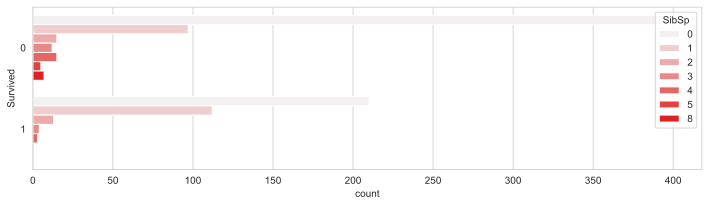

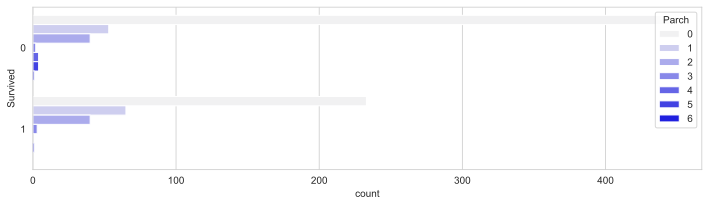

In [27]:
plt.figure(figsize=(12, 3))
ax = sns.countplot(y="Survived", hue="SibSp", data=train_data , color = "Red" )

plt.figure(figsize=(12, 3))
ax = sns.countplot(y="Survived", hue="Parch", data=train_data , color = "Blue"  )

plt.show()

Since Parch and SibSp have strong correlation, we try to combine them into one feature 'Family'. Family denoted by '0' means couple without children, while Family denoted by '1' means couple with children.

In [28]:
def fam(x):
    if  (x['SibSp'] + x['Parch'])  > 0:
        return 1
    else:
        return 0

train['Family'] = train.apply(fam, axis = 1)
test['Family']  = test.apply(fam, axis = 1)

Since we have created feature 'Family', let's drop the feature Parch and SibSp.

In [29]:
train = train.drop(['SibSp','Parch'],axis=1)
test  = test.drop(['SibSp','Parch'],axis=1)

Plot the number of survival families

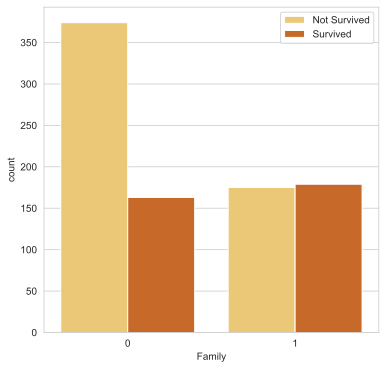

In [30]:
plt.figure(figsize=(6, 6))
sns.set_style('whitegrid')
sns.countplot(x = 'Family',hue='Survived',data=train, palette="YlOrBr" )
plt.legend(("Not Survived","Survived"))

Figure above shows that couple without children had less chance of survival than the ones with children.

#### 6.7 Cabin

Feature Cabin tells us which Cabin number was occupied by a passenger. Here, the prefix values of the cabin number will be used, while the missing values will be replaced with 'X'.

In [31]:
train["Cabin"] = pd.Series([i[0] 
                            if not pd.isnull(i) 
                            else 'X' 
                            for i in train['Cabin'] ])
test["Cabin"]  = pd.Series([i[0] 
                            if not pd.isnull(i) 
                            else 'X' for i in test['Cabin'] ])

Catplot below is generated to see the survival rate of passenger per each Cabin.

<Figure size 288x504 with 0 Axes>

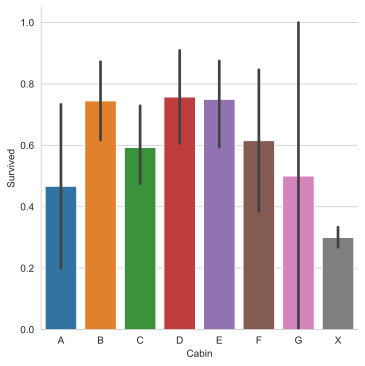

In [32]:
plt.figure(figsize=(4, 7))
g = sns.catplot(y="Survived",x="Cabin",data=train,kind="bar",order=['A','B','C','D','E','F','G','X'])

Map the Cabin character into numerics

In [33]:
train["Cabin"] = train["Cabin"].map({"X":0, "A":1, "B" : 2 , "C":3, "D":4, "E":5, "F":6, "G":7,"T":0})
train["Cabin"] = train["Cabin"].astype(int)
test["Cabin"]  = test["Cabin"].map({"X":0, "A":1, "B" : 2 , "C":3, "D":4, "E":5, "F":6, "G":7,"T":0})
test["Cabin"]  = test["Cabin"].astype(int)

#### 6.8 Names & Titles

Feature 'Name' mentioned the name of every passengers. Along with the names there also a title which can be useful to help us further in the analysis.

Let's split the title from the name as per below

In [34]:
train_title    = [i.split(",")[1].split(".")[0].strip() 
                  for i in train["Name"]]
train["Title"] = pd.Series(train_title)

test_title    = [i.split(",")[1].split(".")[0].strip() 
                 for i in test["Name"]]
test["Title"] = pd.Series(test_title)

In [35]:
print('The list of titles for the passengers names are as follow\n',train["Title"].value_counts())

The list of titles for the passengers names are as follow
 Mr              517
Miss            182
Mrs             125
Master           40
Dr                7
Rev               6
Major             2
Mlle              2
Col               2
Capt              1
the Countess      1
Lady              1
Sir               1
Mme               1
Ms                1
Don               1
Jonkheer          1
Name: Title, dtype: int64


In [36]:
print('The list of titles for the passengers names are as follow\n',test["Title"].value_counts())

The list of titles for the passengers names are as follow
 Mr        240
Miss       78
Mrs        72
Master     21
Rev         2
Col         2
Ms          1
Dr          1
Dona        1
Name: Title, dtype: int64


Replace the above titles with numeric values with the following rule:

* 0 and 1 will be given to young and old male title, respectively 
* 2 and 3 will be given to young and old female title, respectively.

In [37]:
train["Title"] = train["Title"].map({"Mr":1, "Miss":2, "Mrs" : 3 , "Master":0, "Dr":1, "Rev":1, "Col":1,
                                     "Mlle":2, "Major":1, "the Countess":3, "Don":1, "Sir":1, "Lady" :3, 
                                     "Jonkheer":0, "Mme":3, "Capt":1, "Ms":2})
train["Title"] = train["Title"].astype(int)


test["Title"] = test["Title"].map({"Mr":1, "Miss":2, "Mrs" : 3 , "Master":0, "Dr":1, "Rev":1, "Col":1,
                                    "Dona":1,"Ms":2})
test["Title"] = test["Title"].astype(int)

#### 6.9 Ticket

Column 'Ticket' reflects the ticket number of all passengers. Let's extract the ticket prefix as seen below.

In [38]:
Ticket1 = []
for i in list(train.Ticket):
    if not i.isdigit() :
        Ticket1.append(i.replace(".","").replace("/","").strip().split(' ')[0]) #Take prefix
    else:
        Ticket1.append("X")
train["Ticket"] = Ticket1

Ticket2 = []
for j in list(test.Ticket):
    if not j.isdigit() :
        Ticket2.append(j.replace(".","").replace("/","").strip().split(' ')[0]) #Take prefix
    else:
        Ticket2.append("X")
test["Ticket"] = Ticket2

In [39]:
train['Ticket']

0          A5
1          PC
2      STONO2
3           X
4           X
        ...  
886         X
887         X
888        WC
889         X
890         X
Name: Ticket, Length: 891, dtype: object

From our observation, there are few tickets which are unique in each dataset, namely:

In [40]:
train['Ticket'].unique()

array(['A5', 'PC', 'STONO2', 'X', 'PP', 'CA', 'SCParis', 'SCA4', 'A4',
       'SP', 'SOC', 'WC', 'SOTONOQ', 'WEP', 'STONO', 'C', 'SCPARIS',
       'SOP', 'Fa', 'LINE', 'FCC', 'SWPP', 'SCOW', 'PPP', 'SC', 'SCAH',
       'AS', 'SOPP', 'FC', 'SOTONO2', 'CASOTON'], dtype=object)

In [41]:
test["Ticket"].unique()

array(['X', 'A4', 'WEP', 'SCPARIS', 'STONO2', 'PC', 'C', 'A5', 'SCAH',
       'CA', 'WC', 'SOTONOQ', 'STONO', 'SCA3', 'FCC', 'FC', 'PP',
       'STONOQ', 'SCA4', 'SOPP', 'SOC', 'SOTONO2', 'AQ4', 'A', 'SC',
       'SCParis', 'LP', 'AQ3'], dtype=object)

The following tickets are common in both Training and Test set

In [42]:
 intersect_set = np.intersect1d(train["Ticket"], test["Ticket"])
 intersect_set    

array(['A4', 'A5', 'C', 'CA', 'FC', 'FCC', 'PC', 'PP', 'SC', 'SCA4',
       'SCAH', 'SCPARIS', 'SCParis', 'SOC', 'SOPP', 'SOTONO2', 'SOTONOQ',
       'STONO', 'STONO2', 'WC', 'WEP', 'X'], dtype=object)

The following tickets are nowhere to find in Training set

In [43]:
diff_train_to_intersect = np.setdiff1d(train["Ticket"],intersect_set)
diff_train_to_intersect 

array(['AS', 'CASOTON', 'Fa', 'LINE', 'PPP', 'SCOW', 'SOP', 'SP', 'SWPP'],
      dtype=object)

The following tickets are nowhere to find in Test set

In [44]:
diff_test_to_intersect = np.setdiff1d(test["Ticket"],intersect_set)
diff_test_to_intersect

array(['A', 'AQ3', 'AQ4', 'LP', 'SCA3', 'STONOQ'], dtype=object)

One hot encoding is done by using get_dummies() to create additional columns reflecting Ticket prefixes.

In [45]:
train= pd.get_dummies(train, columns = ["Ticket"], prefix="T")
test = pd.get_dummies(test, columns = ["Ticket"], prefix="T")

In order to maintain the same number of columns, some of the columns have to be removed for both training and test set. Columns which are nowhere to be found on Training dan Test set as indicated above will be removed. In addition, drop column 'Name' as well to ensure we leave with numerical type of dataset.

In [46]:
train = train.drop(['Name', 'T_AS', 'T_CASOTON', 'T_Fa', 'T_LINE', 'T_PPP', 'T_SCOW', 'T_SOP', 'T_SP', 'T_SWPP'],axis = 1)
test = test.drop(['Name', 'T_A', 'T_AQ3', 'T_AQ4', 'T_LP', 'T_SCA3', 'T_STONOQ'],axis = 1)

Crosscheck all the column names on both datasets.

In [47]:
print(train.columns,train.shape,'\n')

print(test.columns,test.shape)


Index(['Survived', 'Pclass', 'Age', 'Fare', 'Cabin', 'Age_Cat', 'gender', 'C',
       'Q', 'S', 'Family', 'Title', 'T_A4', 'T_A5', 'T_C', 'T_CA', 'T_FC',
       'T_FCC', 'T_PC', 'T_PP', 'T_SC', 'T_SCA4', 'T_SCAH', 'T_SCPARIS',
       'T_SCParis', 'T_SOC', 'T_SOPP', 'T_SOTONO2', 'T_SOTONOQ', 'T_STONO',
       'T_STONO2', 'T_WC', 'T_WEP', 'T_X'],
      dtype='object') (891, 34) 

Index(['Pclass', 'Age', 'Fare', 'Cabin', 'gender', 'C', 'Q', 'S', 'Family',
       'Title', 'T_A4', 'T_A5', 'T_C', 'T_CA', 'T_FC', 'T_FCC', 'T_PC', 'T_PP',
       'T_SC', 'T_SCA4', 'T_SCAH', 'T_SCPARIS', 'T_SCParis', 'T_SOC', 'T_SOPP',
       'T_SOTONO2', 'T_SOTONOQ', 'T_STONO', 'T_STONO2', 'T_WC', 'T_WEP',
       'T_X'],
      dtype='object') (418, 32)


Drop feature 'Age_Cat' and 'Survived' from Training set.

In [48]:
train.drop(['Survived', 'Age_Cat'],axis=1,inplace=True)
print(train.columns,train.shape,'\n')

Index(['Pclass', 'Age', 'Fare', 'Cabin', 'gender', 'C', 'Q', 'S', 'Family',
       'Title', 'T_A4', 'T_A5', 'T_C', 'T_CA', 'T_FC', 'T_FCC', 'T_PC', 'T_PP',
       'T_SC', 'T_SCA4', 'T_SCAH', 'T_SCPARIS', 'T_SCParis', 'T_SOC', 'T_SOPP',
       'T_SOTONO2', 'T_SOTONOQ', 'T_STONO', 'T_STONO2', 'T_WC', 'T_WEP',
       'T_X'],
      dtype='object') (891, 32) 



Check the Null values for all datasets using heatmap

In [49]:
plt.subplots(figsize=(8,5))
plt.title('Train Data')
sns.heatmap(train.isnull(), 
            yticklabels=False, 
            cbar=False, 
            cmap='viridis')

<AxesSubplot:title={'center':'Train Data'}>

In [50]:
plt.subplots(figsize=(8,5))
plt.title('Test Data')
sns.heatmap(test.isnull(), 
            yticklabels=False, 
            cbar=False, 
            cmap='viridis')

<AxesSubplot:title={'center':'Test Data'}>

In [51]:
print(test.isnull().sum())

Pclass       0
Age          0
Fare         0
Cabin        0
gender       0
C            0
Q            0
S            0
Family       0
Title        0
T_A4         0
T_A5         0
T_C          0
T_CA         0
T_FC         0
T_FCC        0
T_PC         0
T_PP         0
T_SC         0
T_SCA4       0
T_SCAH       0
T_SCPARIS    0
T_SCParis    0
T_SOC        0
T_SOPP       0
T_SOTONO2    0
T_SOTONOQ    0
T_STONO      0
T_STONO2     0
T_WC         0
T_WEP        0
T_X          0
dtype: int64


Since no more missing values in both datasets, we can now proceed with predictive analysis

## 7. Predictive Analysis <a name="pa"></a>

In this section we will proceed with the predicted analysis of Titanic survival.

#### 7.1 Normalize Training Data

Let's define X as the normalized Training dataset

In [69]:
X= preprocessing.StandardScaler().fit(train).transform(train)

and y as the target labels

In [62]:
y = train_data['Survived']

In [66]:
y

0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64

#### 7.2 Develop the Machine Learning Models

As mentioned previously, we will be training various models using different classifiers and choosing the best classifier to give us the most accurate prediction.
Small info about the ML classifiers to be used in this section:
1. **Support Machine Vector (SVM)** <br>
   It is a supervised algorithm that classifies cases through finding a separator by mapping data to a high-dimensional feature space so data points can be categorized, even when the data are not otherwise linearly separable. The kernel parameter to be used in this analysis is linear and radial basis function.<br>
   
2. **Logistic Regression** <br>
    It is a classification algorithm for categorical variables, i.e when the dependent or target variable is binary. To find the best parameter for our model, we need to minimize the cost function. Cost function basically compares the predicted values with the actual values. Cost function minimization can be done through applying optimization solver. <br>
3. **RandomForest** <br>
    It is an ensemble machine learning model which consists of several smaller decision trees. The fundamental concept behind Random Forest is wisdom of crowds. That is to say, if a group of people (in this case trees) come to a decision (in this case classification) after a discussion (in this case absorbing the flaws internally) the result is a very good one (in this case accuracy). Adding on to the fundamental concept is that just like in a crowd the best decision comes when the decision makers are not influenced by each other’s opinion, the Random Forest model should have trees which are uncorrelated.<br>
4. **AdaBoost** <br>
    AdaBoost (Adaptive Boost) is an ensemble learning method which is created to increase the efficiency of binary classifiers. AdaBoost uses an iterative approach to learn from the mistakes of weak classifiers, and turn them into strong ones. Here, different models are generated sequentially and the mistakes of previous models are learned by their successors. This aims at exploiting the dependency between models by giving the mislabeled examples higher weights.<br>
5. **GradientBoosting** <br>
    Gradient boosting is an approach where new models are created that predict the residuals or errors of prior models and then added together to make the final prediction. It is called gradient boosting because it uses a gradient descent algorithm to minimize the loss when adding new models.<br>
6. **XGBoost** <br>
    XGBoost or eXtreem Gradient Boosting, is open-source software library which provides a gradient boosting framework. The name xgboost, actually refers to the engineering goal to push the limit of computations resources in terms of execution speed and model performance of mostly tree-based algorithms.<br>
7. **KNeighbors** <br>
    This method classifies cases based on their similarity to other cases. In this method, data points that are near each other are said to be neighbors. This method is based on similar cases with the same class labels are near each other. Thus, the distance between two cases is a measure of their dissimilarity. 

Let's load the required libraries.

In [60]:
from sklearn.pipeline import Pipeline
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier

import xgboost as xgb
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
from sklearn.model_selection import KFold, cross_val_score

In [63]:
KFold_Score = pd.DataFrame()

classifiers = ['Linear SVM', 'Radial SVM', 'LogisticRegression', 
               'RandomForestClassifier', 'AdaBoostClassifier', 
               'XGBoostClassifier', 'KNeighborsClassifier','GradientBoostingClassifier']

models = [svm.SVC(kernel='linear'),
          svm.SVC(kernel='rbf'),
          LogisticRegression(max_iter = 1000),
          RandomForestClassifier(n_estimators=200, random_state=0),
          AdaBoostClassifier(random_state = 0),
          xgb.XGBClassifier(n_estimators=100),
          KNeighborsClassifier(),
          GradientBoostingClassifier(random_state=0)
         ]
j = 0
for i in models:
    model = i
    cv    = KFold(n_splits=5, random_state=0, shuffle=True)
    KFold_Score[classifiers[j]] = (cross_val_score(model, X, np.ravel(y), scoring = 'accuracy', cv=cv))
    j     = j+1

/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:07:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:07:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:07:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:07:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

#### 7.3 Evaluate the models performance

Utilizing K-Folds Cross validation to evaluate the performance of our models we get the below Table

In [67]:
mean = pd.DataFrame(KFold_Score.mean(), index= classifiers)
KFold_Score = pd.concat([KFold_Score,mean.T])
KFold_Score.index=['Fold 1','Fold 2','Fold 3','Fold 4','Fold 5','Mean']
KFold_Score.T.sort_values(by=['Mean'], ascending = False)

,Fold 1,Fold 2,Fold 3,Fold 4,Fold 5,Mean
RandomForestClassifier,0.843575,0.820225,0.848315,0.831461,0.775281,0.823771
GradientBoostingClassifier,0.843575,0.808989,0.825843,0.831461,0.792135,0.820400
XGBoostClassifier,0.865922,0.752809,0.848315,0.825843,0.780899,0.814757
AdaBoostClassifier,0.804469,0.786517,0.803371,0.797753,0.820225,0.802467
Linear SVM,0.787709,0.769663,0.803371,0.792135,0.803371,0.791250
LogisticRegression,0.810056,0.764045,0.803371,0.775281,0.786517,0.787854
KNeighborsClassifier,0.804469,0.747191,0.825843,0.792135,0.747191,0.783366
Radial SVM,0.765363,0.764045,0.792135,0.780899,0.808989,0.782286


From the Table above we can conclude that RandomForestClassifier gives the highest accuracy with average accuracy of **0.823771**.

#### 7.4 Apply the best classifier to predict the survivals from the Test set

Let's normalize the Test set 

In [1]:
X_test = preprocessing.StandardScaler().fit(test).transform(test)

NameError: name 'preprocessing' is not defined

Build the classifier as per below

In [71]:
rfc = RandomForestClassifier(random_state=0)

Explore the parameter grid and choose the best parameters for our model

In [72]:
param_grid = { 
    'n_estimators': [ 200,300],
    'max_features': ['auto', 'sqrt'],
    'max_depth' : [6,7,8],
    'criterion' :['gini', 'entropy']
}

In [73]:
from sklearn.model_selection import GridSearchCV
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(X,y)
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'auto',
 'n_estimators': 300}

In [75]:
rfc1 = RandomForestClassifier(random_state=0, n_estimators= 300, criterion = 'entropy',max_features = 'auto',max_depth = 8)
rfc1.fit(X, y)

RandomForestClassifier(criterion='entropy', max_depth=8, n_estimators=300,
                       random_state=0)

In [76]:
y_test = rfc1.predict(X_test)
print(y_test)

[0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1
 0 0 0 0 0 0 1 1 0 0 0 1 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 0 1 1 0 0 1
 1 0 0 1 0 1 1 0 0 0 0 0 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0
 1 1 1 1 0 0 1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 1
 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 1 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0
 1 0 1 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 1
 0 0 0 1 1 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 1 0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 0 0 1 0
 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0
 0 1 0 1 1 1 0 1 0 0 1]


In [77]:
y_test.shape

(418,)

In [82]:
test_data2  = pd.read_csv('../data/test.csv')

In [83]:
output = pd.DataFrame({'PassengerId': test_data2.PassengerId, 'Survived': y_test})
output.to_csv('./submission.csv', index=False)

The output of the prediction was submitted and scored by Kaggle and I have received the accuracy of 0.79 as seen in below figure. Not bad! 

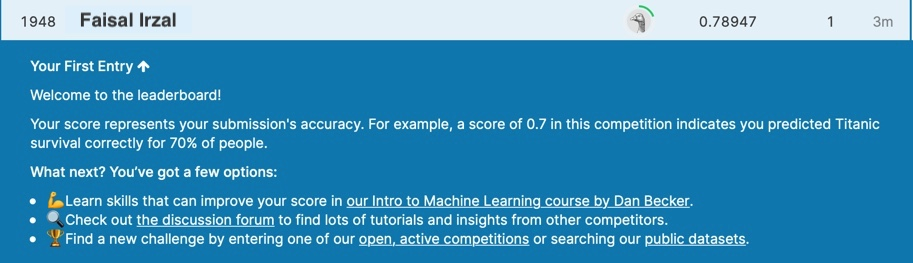

In [88]:
from IPython.display import Image
Image(filename="Titanic_1st.jpg")

## 8. Conclusion <a name="co"></a>

1. Predictive models based on several Machine Learning techniques have been developed to predict the survival of the Titanic tragedy. Here Training and Test set were given as input. Training set consists of all passangers' features and survival label of passengers, while Test set consists only passengers' features without survival label
2. Descriptive Statistical methods have been used to measure and describe all the datasets and to get insights of the features and the correlations between features
3. Feature analysis has been conducted to analyse and decided which features to be used in the Training Set for developing the predictive model
4. A number of classification methods have been trained and developed based on the Training set and performance of each classifier has been evaluated by utilizing K-Fold Cross Validation method. From the evaluation, it turned out that RandomForest classifier has outperformed the rest of the classifiers with the mean accuracy of 0.82
5. This classifier was later used to predict the survival label of passengers from the Test set. The result has been sent to platform Kaggle.com and gave back the accucary of 0.78.

Do you want to learn more about Machine Learning? Let's learn together and contact me at faisal.irzal@gmail.com